In [57]:
%pip install tensorflow  matplotlib pandas scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [58]:
import pathlib, random, math, shutil
import pathlib, tensorflow as tf, random
import tensorflow as tf

In [59]:
import pathlib, shutil, random, math

def split_train_test(
        root_dir,                        # carpeta que contiene train_Original/
        source_dir="DATASET",
        test_pct=0.20,
        seed=42,
        delete_existing=True,            # borra train/ y test/ si existen
        dry_run=False                    # True → solo muestra acciones
    ):
    """
    Copia las imágenes de source_dir en carpetas nuevas
    con la proporción  (1 - test_pct) / test_pct  (por defecto 80 / 20).

    Si `delete_existing` es True, elimina cualquier train/ o test/ previo.
    Acepta extensiones .jpg/.jpeg/.png.
    """
    root    = pathlib.Path(root_dir)
    src_dir = root / source_dir
    assert src_dir.exists(), f"No se encontró '{source_dir}'"

    # Borrar divisiones anteriores
    if delete_existing:
        for name in ("train", "test"):
            target = root / name
            if target.exists():
                if dry_run:
                    print(f"[DRY RUN] Eliminaría {target}")
                else:
                    shutil.rmtree(target)

    random.seed(seed)

    # Recorrer cada clase y copiar
    for cls_dir in src_dir.iterdir():
        if not cls_dir.is_dir():
            continue                                 
        imgs = [p for p in cls_dir.iterdir()
                if p.suffix.lower() in {".jpg", ".jpeg", ".png"}]
        if not imgs:
            continue

        random.shuffle(imgs)
        n_test      = math.floor(len(imgs) * test_pct)
        test_imgs   = imgs[:n_test]
        train_imgs  = imgs[n_test:]

        for split, split_imgs in [("train", train_imgs), ("test", test_imgs)]:
            dest = root / split / cls_dir.name
            if not dry_run:
                dest.mkdir(parents=True, exist_ok=True)

            for img in split_imgs:
                if dry_run:
                    print(f"[{split.upper()}] copiaría {img.name} -> {dest}")
                else:
                    shutil.copy2(img, dest)

    if dry_run:
        print("DRY RUN.")
    else:
        print("División 80-20 completada con copia y reemplazo de carpetas.")

DATASET_DIR = "./"
split_train_test(DATASET_DIR, dry_run=False)


División 80-20 completada con copia y reemplazo de carpetas.


In [60]:
from collections import Counter

def count_split(path):
    c = Counter(p.parent.name for p in pathlib.Path(path).rglob('*') if p.suffix.lower() in {'.jpg','.jpeg','.png'})
    total = sum(c.values())
    return total, c

for split in ("train", "test"):
    tot, cls = count_split(DATASET_DIR + "/" + split)
    print(f"{split.upper():5}  {tot} imágenes")
    print("   " + ", ".join(f"{k}:{v}" for k,v in cls.items()))


TRAIN  5113 imágenes
   trap-jaw-ants:520, black-crazy-ants:417, leafcutter-ants:1039, yellow-crazy-ants:468, argentine-ants:1136, weaver-ants:612, fire-ants:921
TEST   1274 imágenes
   trap-jaw-ants:129, black-crazy-ants:104, leafcutter-ants:259, yellow-crazy-ants:116, argentine-ants:284, weaver-ants:152, fire-ants:230


In [61]:
# Procesar los datos
IMG_SIZE = (224,224)
BATCH    = 16


In [62]:
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
from PIL import Image, ImageOps

def random_contrast(img):
    """
    Recibe un tensor [H, W, 3] en rango 0-1 y devuelve la misma imagen
    con contraste multiplicado por un factor aleatorio.
    """
    # ImageDataGenerator entrega un array float32 ya re-escalado (0-1)
    factor = tf.random.uniform([], 0.7, 1.3)
    img_tf = tf.image.adjust_contrast(img, factor)
    return img_tf.numpy()


# Clases a ignorar
IGNORE = []
root   = pathlib.Path("./")  

# Lista completa de carpetas dentro de train/
all_classes     = sorted([d.name for d in (root/"train").iterdir() if d.is_dir()])
include_classes = [c for c in all_classes if c not in IGNORE]

print("Classes usadas :", include_classes)
print("Classes ignoradas:", IGNORE)

train_datagen = ImageDataGenerator(
    rescale             = 1./255,
    rotation_range      = 20,
    width_shift_range   = 0.15,
    height_shift_range  = 0.15,
    zoom_range          = (0.7, 1.3),
    horizontal_flip     = True,
    vertical_flip       = True,
    fill_mode           = "wrap",
    brightness_range    = (0.7, 1.3),
    preprocessing_function = lambda img: random_contrast(img),
    validation_split    = 0.15
)


test_datagen = ImageDataGenerator(rescale = 1./255)

train_gen = train_datagen.flow_from_directory(
    os.path.join(DATASET_DIR, "train"),
    classes     = include_classes,
    target_size = IMG_SIZE,
    batch_size  = BATCH,
    subset      = "training",
    class_mode  = "categorical",
    shuffle     = True
)

val_gen = train_datagen.flow_from_directory(
    os.path.join(DATASET_DIR, "train"),
    classes     = include_classes,
    target_size = IMG_SIZE,
    batch_size  = BATCH,
    subset      = "validation",
    class_mode  = "categorical",
    shuffle     = True
)

test_gen = test_datagen.flow_from_directory(
    os.path.join(DATASET_DIR, "test"),
    classes     = include_classes,
    target_size = IMG_SIZE,
    batch_size  = BATCH,
    class_mode  = "categorical",
    shuffle     = False
)



Classes usadas : ['argentine-ants', 'black-crazy-ants', 'fire-ants', 'leafcutter-ants', 'trap-jaw-ants', 'weaver-ants', 'yellow-crazy-ants']
Classes ignoradas: []
Found 4349 images belonging to 7 classes.
Found 764 images belonging to 7 classes.
Found 1274 images belonging to 7 classes.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.052474353..0.9894016].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.061448753..0.87000173].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04593974..1.0189567].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.025450436..1.0066801].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03806839..0.85101795].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.00020302706..0.7679155].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got ra

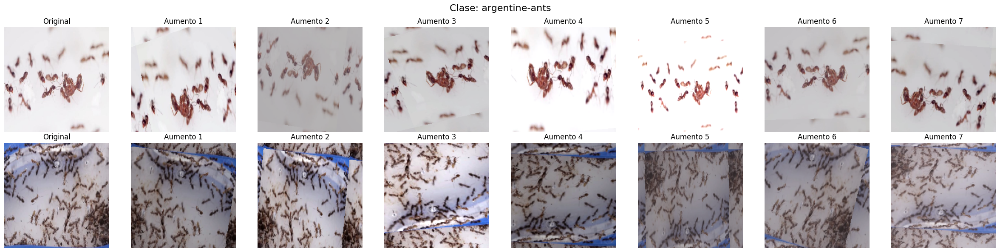

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03392204..1.0287584].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.030444076..0.8208643].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.024560232..0.7307094].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.08595258..1.1100228].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.08289952..1.0844643].


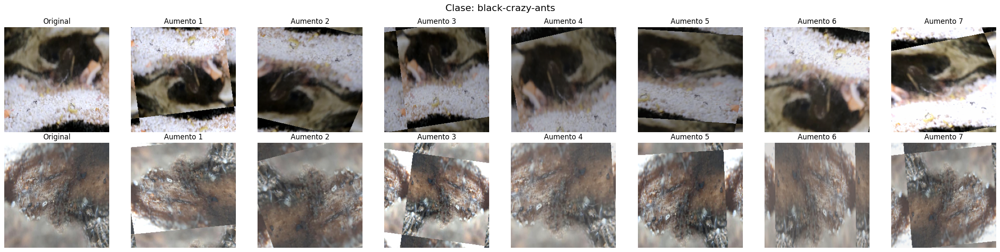

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.09046415..1.0387046].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.026775923..1.0678884].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.020551028..1.0238214].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.014921897..0.7931698].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10549416..1.1576874].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.062507935..0.83850783].


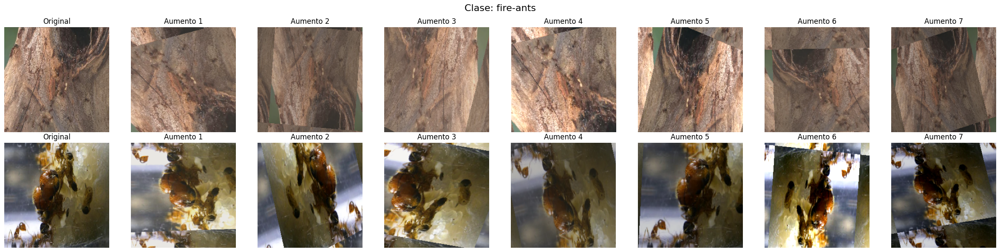

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07128191..0.7792731].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11665612..1.059935].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09776705..0.816476].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08976763..0.8519314].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.046415005..1.0645335].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1386728..1.1880263].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08

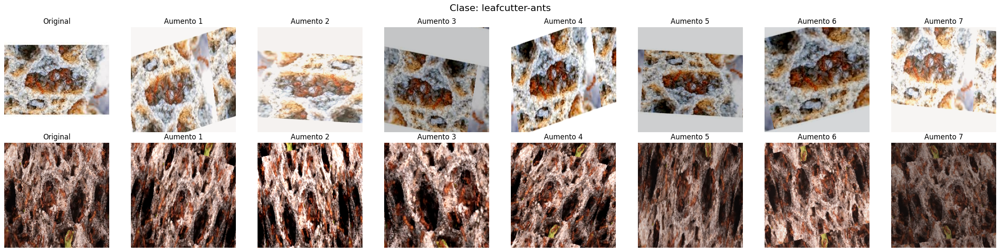

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.010808905..1.0554101].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.029916076..1.0117123].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.057359014..0.783161].


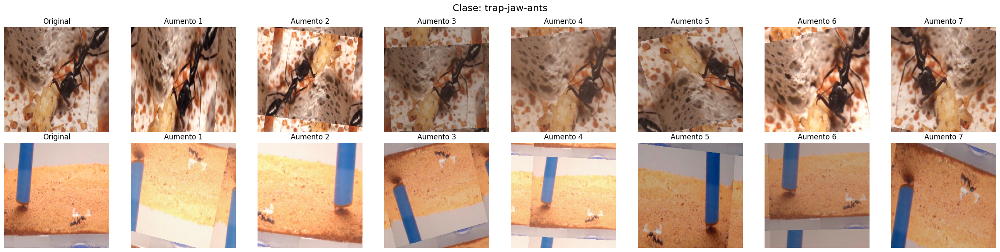

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.055513185..0.6975698].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.084461406..1.1439366].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.011204283..0.9312854].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.036757752..0.77169406].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.017870693..1.028996].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08994913..1.1363218].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range

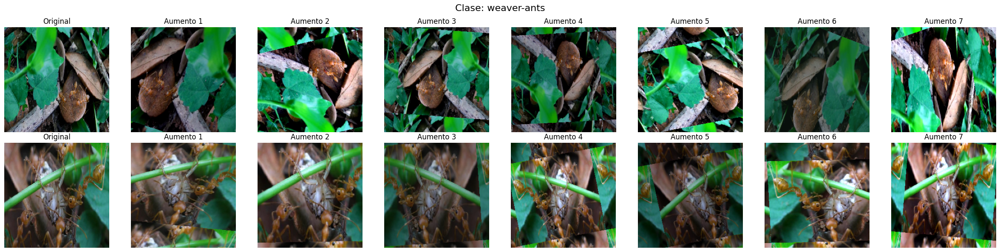

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.024274398..1.0482621].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.028670698..0.9597242].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06952817..0.8419199].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.053590607..0.8489729].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07133455..0.9849485].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.15789466..1.2124732].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [

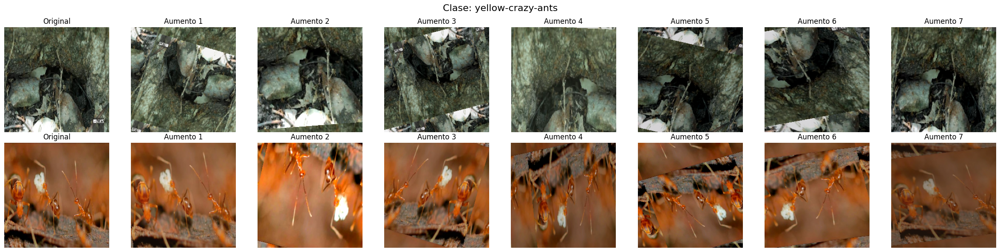

In [63]:
import os, random, numpy as np, matplotlib.pyplot as plt, tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Generador SIN aumentos (solo rescale) para extraer originales
base_datagen = ImageDataGenerator(rescale=1./255)
images_per_class = 2
augs_per_class = 7

def sample_originals(class_name):
    """Devuelve imágenes (float32 0-1) de la clase pedida."""
    class_dir = os.path.join(DATASET_DIR, "train", class_name)
    img_files = [os.path.join(class_dir, f)
                 for f in os.listdir(class_dir)
                 if f.lower().endswith((".jpg", ".jpeg", ".png"))]

    if len(img_files) == 0:
        raise ValueError(f"No se encontraron imágenes para {class_name}")

    # Si hay menos de 3 imágenes, se repiten para completar
    chosen = random.choices(img_files, k=images_per_class)

    imgs = []
    for f in chosen:
        img = tf.keras.utils.load_img(f, target_size=IMG_SIZE)
        img = tf.keras.utils.img_to_array(img) / 255.0
        imgs.append(img)
    return imgs  # lista de imagenes

for class_name in include_classes:
    originals = sample_originals(class_name)
    rows, cols = images_per_class, augs_per_class + 1
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
    fig.suptitle(f"Clase: {class_name}", fontsize=16)

    for r, orig_img in enumerate(originals):
        # Original 
        axes[r, 0].imshow(orig_img)
        axes[r, 0].set_title("Original")
        axes[r, 0].axis("off")

        # Cuatro aumentos 
        img_uint8 = (orig_img * 255).astype(np.uint8)
        aug_iter  = train_datagen.flow(np.expand_dims(img_uint8, 0),
                                       batch_size=1, shuffle=False)
        for c in range(augs_per_class):
            aug_img = next(aug_iter)[0]      # ya viene float32 0-1
            axes[r, c + 1].imshow(aug_img)
            axes[r, c + 1].set_title(f"Aumento {c + 1}")
            axes[r, c + 1].axis("off")

    plt.tight_layout()
    plt.show()


In [64]:
# Equilibrio de pesos en clases 
from sklearn.utils.class_weight import compute_class_weight
weights = compute_class_weight('balanced',
                               classes=np.unique(train_gen.classes),
                               y=train_gen.classes)
class_weight = dict(enumerate(weights))


In [65]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.metrics import Precision, Recall, AUC

model = models.Sequential([
    layers.Input(shape=IMG_SIZE + (3,)),
    layers.Conv2D(96, 3, activation="relu", padding="same"),
    layers.Conv2D(256, 3, activation="relu", padding="same"),
    layers.MaxPooling2D(),
    layers.Conv2D(256, 3, activation="relu", padding="same"),
    layers.MaxPooling2D(),
    layers.Conv2D(256, 3, activation="relu", padding="same"),
    layers.MaxPooling2D(),
    layers.Conv2D(256, 3, activation="relu", padding="same"),
    layers.MaxPooling2D(),
    layers.Conv2D(256, 3, activation="relu", padding="same"),
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation="relu"),
    layers.Dense(train_gen.num_classes, activation="softmax")
])

model.compile(
    optimizer="adam",
    loss="categorical_crossentropy",
    metrics=["accuracy"],
)

model.summary()


Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_54 (Conv2D)          (None, 224, 224, 96)      2688      
                                                                 
 conv2d_55 (Conv2D)          (None, 224, 224, 256)     221440    
                                                                 
 max_pooling2d_36 (MaxPooli  (None, 112, 112, 256)     0         
 ng2D)                                                           
                                                                 
 conv2d_56 (Conv2D)          (None, 112, 112, 256)     590080    
                                                                 
 max_pooling2d_37 (MaxPooli  (None, 56, 56, 256)       0         
 ng2D)                                                           
                                                                 
 conv2d_57 (Conv2D)          (None, 56, 56, 256)      

In [66]:
class TestPerformance(tf.keras.callbacks.Callback):
    def __init__(self, test_data):
        super().__init__()
        self.test_data = test_data
        self.test_losses = []
        self.test_accs   = []

    def on_epoch_end(self, epoch, logs=None):
        loss, acc = self.model.evaluate(
            self.test_data,
            verbose=0
        )
        self.test_losses.append(loss)
        self.test_accs.append(acc)
        logs = logs or {}
        logs["test_loss"] = loss
        logs["test_accuracy"] = acc

test_callback = TestPerformance(test_gen)

In [67]:

history = model.fit(
    train_gen,
    epochs=60,
    steps_per_epoch=150,
    validation_data=val_gen,
    class_weight=class_weight,
    callbacks=[test_callback]
)

Epoch 1/60
150/150 [==============================] - 59s 384ms/step - loss: 1.9496 - accuracy: 0.1529 - val_loss: 2.0535 - val_accuracy: 0.2448 - test_loss: 2.0203 - test_accuracy: 0.1837
Epoch 2/60
 77/150 [==============>...............] - ETA: 20s - loss: 1.9250 - accuracy: 0.2208

2025-05-26 12:18:56.886947: W external/local_tsl/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.37GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


150/150 [==============================] - 58s 386ms/step - loss: 1.8550 - accuracy: 0.2587 - val_loss: 1.7372 - val_accuracy: 0.3508 - test_loss: 1.6084 - test_accuracy: 0.3595
Epoch 3/60
150/150 [==============================] - 59s 390ms/step - loss: 1.7176 - accuracy: 0.2858 - val_loss: 1.7730 - val_accuracy: 0.2291 - test_loss: 1.6330 - test_accuracy: 0.2896
Epoch 4/60
150/150 [==============================] - 66s 440ms/step - loss: 1.6612 - accuracy: 0.2966 - val_loss: 1.7585 - val_accuracy: 0.3246 - test_loss: 1.6109 - test_accuracy: 0.3548
Epoch 5/60
150/150 [==============================] - 79s 528ms/step - loss: 1.6224 - accuracy: 0.3175 - val_loss: 1.8234 - val_accuracy: 0.2565 - test_loss: 1.5825 - test_accuracy: 0.3485
Epoch 6/60
150/150 [==============================] - 76s 507ms/step - loss: 1.5142 - accuracy: 0.3730 - val_loss: 1.5835 - val_accuracy: 0.3298 - test_loss: 1.4381 - test_accuracy: 0.4435
Epoch 7/60
 42/150 [=======>......................] - ETA: 40s - l

2025-05-26 12:24:52.384051: W external/local_tsl/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.37GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


130/150 [=========================>....] - ETA: 7s - loss: 1.5173 - accuracy: 0.3567

2025-05-26 12:25:26.424001: W external/local_tsl/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.37GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


150/150 [==============================] - 75s 502ms/step - loss: 1.5050 - accuracy: 0.3600 - val_loss: 1.7308 - val_accuracy: 0.2605 - test_loss: 1.4532 - test_accuracy: 0.3611
Epoch 8/60
 39/150 [======>.......................] - ETA: 41s - loss: 1.5353 - accuracy: 0.3559

2025-05-26 12:26:06.992487: W external/local_tsl/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.37GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


 91/150 [=================>............] - ETA: 22s - loss: 1.4812 - accuracy: 0.3772

2025-05-26 12:26:26.488415: W external/local_tsl/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.37GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


150/150 [==============================] - 74s 495ms/step - loss: 1.4851 - accuracy: 0.3817 - val_loss: 1.5267 - val_accuracy: 0.3809 - test_loss: 1.3542 - test_accuracy: 0.4757
Epoch 9/60
  1/150 [..............................] - ETA: 57s - loss: 1.3497 - accuracy: 0.5000

2025-05-26 12:27:06.904339: W external/local_tsl/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.37GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


 67/150 [============>.................] - ETA: 30s - loss: 1.4389 - accuracy: 0.4238

2025-05-26 12:27:31.487235: W external/local_tsl/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.37GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


150/150 [==============================] - 74s 496ms/step - loss: 1.4491 - accuracy: 0.4109 - val_loss: 1.6269 - val_accuracy: 0.3141 - test_loss: 1.4222 - test_accuracy: 0.4137
Epoch 10/60
150/150 [==============================] - 76s 504ms/step - loss: 1.4126 - accuracy: 0.4364 - val_loss: 1.5660 - val_accuracy: 0.4058 - test_loss: 1.3244 - test_accuracy: 0.5235
Epoch 11/60
150/150 [==============================] - 76s 505ms/step - loss: 1.3643 - accuracy: 0.4625 - val_loss: 1.6350 - val_accuracy: 0.4490 - test_loss: 1.3739 - test_accuracy: 0.5141
Epoch 12/60
150/150 [==============================] - 75s 500ms/step - loss: 1.3935 - accuracy: 0.4564 - val_loss: 1.5473 - val_accuracy: 0.3979 - test_loss: 1.3230 - test_accuracy: 0.5063
Epoch 13/60
150/150 [==============================] - 75s 498ms/step - loss: 1.3254 - accuracy: 0.4852 - val_loss: 1.5191 - val_accuracy: 0.3979 - test_loss: 1.2375 - test_accuracy: 0.5408
Epoch 14/60
150/150 [==============================] - 75s 503

In [68]:
test_loss, test_acc = model.evaluate(test_gen)
print(f"Precisión en test: {test_acc:.2%}")

80/80 [==============================] - 7s 83ms/step - loss: 0.6817 - accuracy: 0.7857
Precisión en test: 78.57%


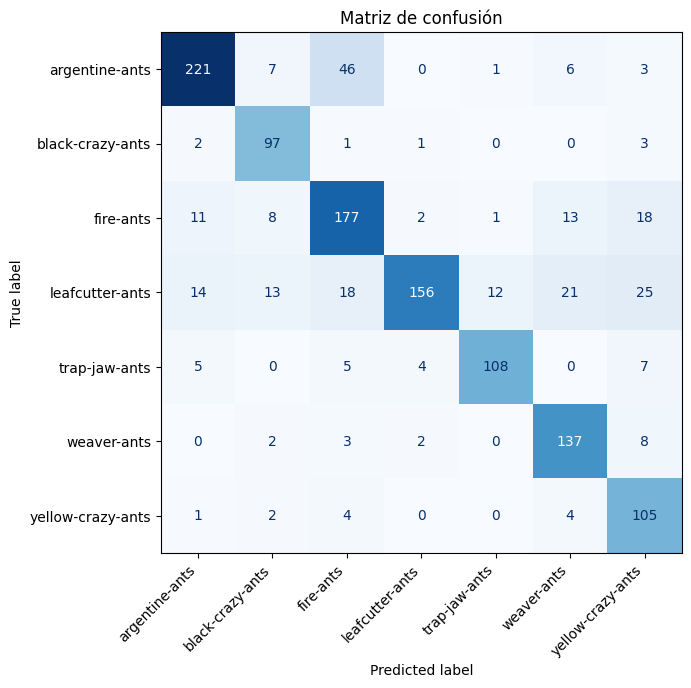

                   precision    recall  f1-score   support

   argentine-ants       0.87      0.78      0.82       284
 black-crazy-ants       0.75      0.93      0.83       104
        fire-ants       0.70      0.77      0.73       230
  leafcutter-ants       0.95      0.60      0.74       259
    trap-jaw-ants       0.89      0.84      0.86       129
      weaver-ants       0.76      0.90      0.82       152
yellow-crazy-ants       0.62      0.91      0.74       116

         accuracy                           0.79      1274
        macro avg       0.79      0.82      0.79      1274
     weighted avg       0.81      0.79      0.79      1274



In [69]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report

gen = test_gen

y_pred_prob = model.predict(gen, verbose=0)
y_pred      = np.argmax(y_pred_prob, axis=1)
y_true      = gen.classes

cm = confusion_matrix(y_true, y_pred)
labels = list(gen.class_indices.keys())   # nombres de las clases

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
fig, ax = plt.subplots(figsize=(7,7))
disp.plot(ax=ax, cmap="Blues", colorbar=False, values_format="d")
plt.xticks(rotation=45, ha="right")
plt.title("Matriz de confusión")
plt.tight_layout()
plt.show()

print(classification_report(y_true, y_pred, target_names=labels))


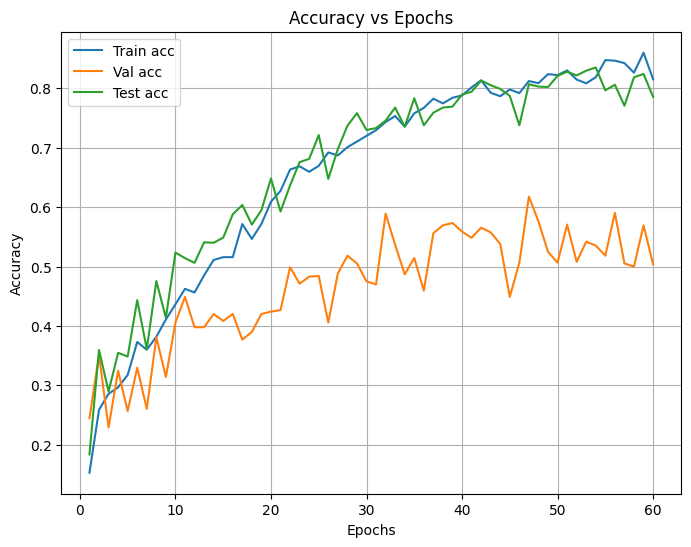

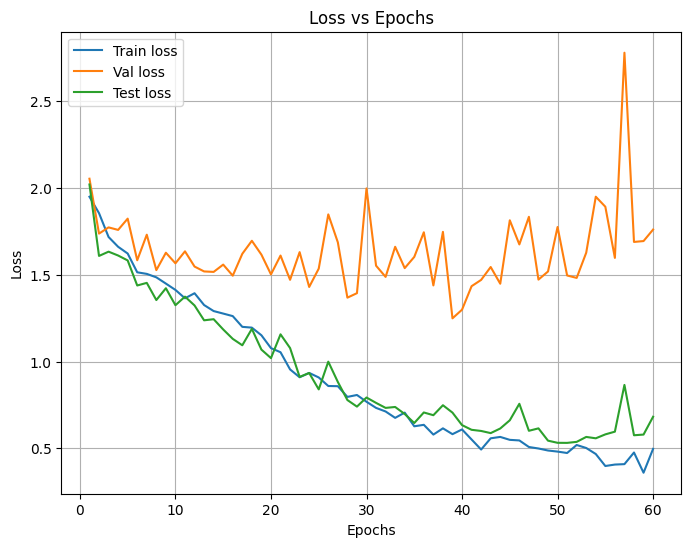

: 

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Convert history to DataFrame
frame = pd.DataFrame(history.history)
frame["test_loss"]      = test_callback.test_losses
frame["test_accuracy"]  = test_callback.test_accs
epochs = frame.index + 1

# Accuracy vs Epochs
plt.figure(figsize=(8, 6))
plt.plot(epochs, frame["accuracy"], label="Train acc")
plt.plot(epochs, frame["val_accuracy"], label="Val acc")
plt.plot(epochs, frame["test_accuracy"], label="Test acc")
plt.title("Accuracy vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.show()

# Loss vs Epochs
plt.figure(figsize=(8, 6))
plt.plot(epochs, frame["loss"], label="Train loss")
plt.plot(epochs, frame["val_loss"], label="Val loss")
plt.plot(epochs, frame["test_loss"], label="Test loss")
plt.title("Loss vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

#config
NUM_SAMPLES = 10
class_names = list(test_gen.class_indices.keys())
num_classes = len(class_names)

# recopilar TODO el test set
imgs, labels = [], []
for i in range(len(test_gen)):            # len(test_gen) = numero de lotes
    batch_imgs, batch_lbls = test_gen[i]  # ya son np.arrays
    imgs.append(batch_imgs)
    labels.append(batch_lbls)

imgs   = np.concatenate(imgs, axis=0)
labels = np.concatenate(labels, axis=0)

# elegir N ejemplos al azar
idx            = np.random.choice(len(imgs), NUM_SAMPLES, replace=False)
sample_imgs    = imgs[idx]
sample_labels  = np.argmax(labels[idx], axis=1)

# predicciones
preds = model.predict(sample_imgs, verbose=0)

# dibujar
fig, axes = plt.subplots(NUM_SAMPLES, 2, figsize=(16, 4 * NUM_SAMPLES))
fig.subplots_adjust(hspace=0.6, wspace=0.3)

for i, (img, true_idx, pred_vec) in enumerate(zip(sample_imgs,
                                                  sample_labels,
                                                  preds)):
    # Columna de la imagen
    axes[i, 0].imshow((img * 255).astype("uint8"))   # ⇐ reescala para mostrar
    axes[i, 0].axis("off")
    axes[i, 0].set_title(f"Real: {class_names[true_idx]}\n"
                         f"Pred: {class_names[np.argmax(pred_vec)]}")

    # Columna de la distribución
    axes[i, 1].bar(range(num_classes), pred_vec)
    axes[i, 1].set_xticks(range(num_classes))
    axes[i, 1].set_xticklabels(class_names, rotation=45, ha="right")
    axes[i, 1].set_ylim([0, 1])
    axes[i, 1].set_ylabel("Probabilidad")
    axes[i, 1].set_title("Distribución de la predicción")

plt.show()



In [ ]:
# Guardar el modelo
import datetime

test_loss, test_acc = model.evaluate(test_gen, verbose=0) 
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M")

model_name = f"modelo_{timestamp}_testAcc{test_acc:.2f}.h5"

model.save(model_name)
print(f"Modelo guardado como: {model_name}")


Modelo guardado como: modelo_20250526_0335_testAcc0.83.h5


/home/pablo/miniconda3/envs/tf216/lib/python3.11/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
